# Pretrain DAMSM Breakdown

This is an attempt to break down the AttnGAN code, starting at the `pretrain_DAMSM.py` code. 

I will only break the code down in things that are related to the training process and I will ignore config or arg parsing.

## What is DAMSM?

From the AttnGAN paper:

```
The other component in the AttnGAN is a Deep Attentional Multimodal Similarity Model (DAMSM). With an attention mechanism, the DAMSM is able to compute the similarity between the generated image and the sentence using both the global sentence level information and the fine-grained word level information. Thus, the DAMSM provides an ad- ditional fine-grained image-text matching loss for training the generator.

...

3.2. Deep Attentional Multimodal Similarity Model

The DAMSM learns two neural networks that map sub-regions of the image and words of the sentence to a common semantic space, thus measures the image-text similarity at the word level to compute a fine-grained loss for image generation.
```


## Loading the config file

We will load the config from the file `cfg/DAMSM/bird.yml`

In [73]:
from miscc.config import cfg, cfg_from_file
import pprint

cfg_from_file("cfg/DAMSM/bird.yml")
# We'll use GPU_ID 0
cfg.GPU_ID = 0
# Maybe we can increase the number of workers?
cfg.WORKERS = 4
# Since I'm breaking up the code here, 
# I don't really want to train the algorithm
# So I'll reduce the TRAIN.MAX_EPOCH from 600 to 1
cfg.TRAIN.MAX_EPOCH = 1
pprint.pprint(cfg)

{'B_VALIDATION': False,
 'CONFIG_NAME': 'DAMSM',
 'CUDA': True,
 'DATASET_NAME': 'birds',
 'DATA_DIR': '../data/birds',
 'GAN': {'B_ATTENTION': True,
         'B_DCGAN': False,
         'CONDITION_DIM': 100,
         'DF_DIM': 64,
         'GF_DIM': 128,
         'R_NUM': 2,
         'Z_DIM': 100},
 'GPU_ID': 0,
 'RNN_TYPE': 'LSTM',
 'TEXT': {'CAPTIONS_PER_IMAGE': 10, 'EMBEDDING_DIM': 256, 'WORDS_NUM': 18},
 'TRAIN': {'BATCH_SIZE': 48,
           'B_NET_D': True,
           'DISCRIMINATOR_LR': 0.0002,
           'ENCODER_LR': 0.002,
           'FLAG': True,
           'GENERATOR_LR': 0.0002,
           'MAX_EPOCH': 1,
           'NET_E': '',
           'NET_G': '',
           'RNN_GRAD_CLIP': 0.25,
           'SMOOTH': {'GAMMA1': 4.0,
                      'GAMMA2': 5.0,
                      'GAMMA3': 10.0,
                      'LAMBDA': 1.0},
           'SNAPSHOT_INTERVAL': 50},
 'TREE': {'BASE_SIZE': 299, 'BRANCH_NUM': 1},
 'WORKERS': 4}


/notebooks/AttnGAN/code/miscc/config.py:103: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  yaml_cfg = edict(yaml.load(f))


## Setting up everything

### Manual Seed

In [74]:
import random
import numpy as np
import torch

# TODO: understand what is the manualSeed
# It can be either 100 or a random int between 1 and 10000
# manualSeed = random.randint(1, 10000)
manualSeed = 100
random.seed(manualSeed)
np.random.seed(manualSeed)
torch.manual_seed(manualSeed)
# We are using CUDA
torch.cuda.manual_seed_all(manualSeed)

### Output directory and format

In [75]:
from miscc.utils import mkdir_p

import datetime
import dateutil.tz
import os

now = datetime.datetime.now(dateutil.tz.tzlocal())
timestamp = now.strftime('%Y_%m_%d_%H_%M_%S')
output_dir = '../output/%s_%s_%s' % \
    (cfg.DATASET_NAME, cfg.CONFIG_NAME, timestamp)

print(output_dir)

model_dir = os.path.join(output_dir, 'Model')
image_dir = os.path.join(output_dir, 'Image')
mkdir_p(model_dir)
mkdir_p(image_dir)

../output/birds_DAMSM_2020_09_22_15_15_11


### CUDA settings

In [76]:
import torch.backends.cudnn as cudnn

torch.cuda.set_device(cfg.GPU_ID)
cudnn.benchmark = True

### Data Loader

#### Setting up

In [77]:
from datasets import TextDataset

import torchvision.transforms as transforms

# From the paper
# Since the size of images for pretraining DAMSM 
# is not limited by the size of images that can be generated, real images of size 299×299 are utilized.
imsize = cfg.TREE.BASE_SIZE * (2 ** (cfg.TREE.BRANCH_NUM-1))
print(f"Image Size {imsize}")

batch_size = cfg.TRAIN.BATCH_SIZE

image_transform = transforms.Compose([
    transforms.Scale(int(imsize * 76 / 64)),
    transforms.RandomCrop(imsize),
    transforms.RandomHorizontalFlip()])

print(image_transform)

Image Size 299
Compose(
    Scale(size=355, interpolation=PIL.Image.BILINEAR)
    RandomCrop(size=(299, 299), padding=None)
    RandomHorizontalFlip(p=0.5)
)


#### Loading the train data set

In [78]:
dataset = TextDataset(
    data_dir=cfg.DATA_DIR, 
    split='train',
    base_size=cfg.TREE.BASE_SIZE,
    transform=image_transform
)

print(dataset.n_words, dataset.embeddings_num)
assert dataset

dataloader = torch.utils.data.DataLoader(
        dataset, batch_size=batch_size, drop_last=True,
        shuffle=True, num_workers=int(cfg.WORKERS))

Total filenames:  11788 001.Black_footed_Albatross/Black_Footed_Albatross_0046_18.jpg
Load filenames from: ../data/birds/train/filenames.pickle (8855)
Load filenames from: ../data/birds/test/filenames.pickle (2933)
Load from:  ../data/birds/captions.pickle
5450 10


#### Loading the test data set

In [79]:
dataset_val = TextDataset(
    data_dir=cfg.DATA_DIR, 
    split='test',
    base_size=cfg.TREE.BASE_SIZE,
    transform=image_transform
)

dataloader_val = torch.utils.data.DataLoader(
    dataset_val, batch_size=batch_size, drop_last=True,
    shuffle=True, num_workers=int(cfg.WORKERS))

Total filenames:  11788 001.Black_footed_Albatross/Black_Footed_Albatross_0046_18.jpg
Load filenames from: ../data/birds/train/filenames.pickle (8855)
Load filenames from: ../data/birds/test/filenames.pickle (2933)
Load from:  ../data/birds/captions.pickle


## Building models for training

Here, I'll break down the `build_models` function. 

In [80]:
from model import RNN_ENCODER, CNN_ENCODER

import torch
from torch.autograd import Variable

def build_models():
    text_encoder = RNN_ENCODER(dataset.n_words, nhidden=cfg.TEXT.EMBEDDING_DIM)
    image_encoder = CNN_ENCODER(cfg.TEXT.EMBEDDING_DIM)
    labels = Variable(torch.LongTensor(range(batch_size)))
    start_epoch = 0
    # I will ignore cfg.TRAIN.NET_E
    if cfg.CUDA:
        text_encoder = text_encoder.cuda()
        image_encoder = image_encoder.cuda()
        labels = labels.cuda()

    return text_encoder, image_encoder, labels, start_epoch

text_encoder, image_encoder, labels, start_epoch = build_models()
para = list(text_encoder.parameters())
for v in image_encoder.parameters():
    if v.requires_grad:
        para.append(v)

Load pretrained model from  https://download.pytorch.org/models/inception_v3_google-1a9a5a14.pth


## Training

Here, I will break down the training loop and the train and the evaluate function. 

### The training function 

In [84]:
from miscc.losses import sent_loss, words_loss
from miscc.utils import build_super_images

from datasets import prepare_data

import time
from PIL import Image

UPDATE_INTERVAL = 200

def train(dataloader, cnn_model, rnn_model, batch_size,
          labels, optimizer, epoch, ixtoword, image_dir):
    # Here, we train a Convolutional Neural Network
    cnn_model.train()
    # And a Recurrent Neural Network
    rnn_model.train()
    
    # Initial sentence losses
    s_total_loss0 = 0
    s_total_loss1 = 0
    
    # Initial word losses
    w_total_loss0 = 0
    w_total_loss1 = 0
    
    count = (epoch + 1) * len(dataloader)
    print(f"Initial count {count}")

    start_time = time.time()

    for step, data in enumerate(dataloader, 0):
        print(f"Step {step}")
        rnn_model.zero_grad()
        cnn_model.zero_grad()

        imgs, captions, cap_lens, \
            class_ids, keys = prepare_data(data)


        # words_features: batch_size x nef x 17 x 17
        # sent_code: batch_size x nef
        words_features, sent_code = cnn_model(imgs[-1])
        # --> batch_size x nef x 17*17
        nef, att_sze = words_features.size(1), words_features.size(2)
        # words_features = words_features.view(batch_size, nef, -1)

        hidden = rnn_model.init_hidden(batch_size)
        # words_emb: batch_size x nef x seq_len
        # sent_emb: batch_size x nef
        words_emb, sent_emb = rnn_model(captions, cap_lens, hidden)

        # Calculate word loss and the total word loss
        w_loss0, w_loss1, attn_maps = words_loss(words_features, words_emb, labels,
                                                 cap_lens, class_ids, batch_size)
        w_total_loss0 += w_loss0.data
        w_total_loss1 += w_loss1.data
        loss = w_loss0 + w_loss1

        # Calculate sentence loss and the total sentence loss
        s_loss0, s_loss1 = \
            sent_loss(sent_code, sent_emb, labels, class_ids, batch_size)
        loss += s_loss0 + s_loss1
        s_total_loss0 += s_loss0.data
        s_total_loss1 += s_loss1.data
        #
        loss.backward()
        #
        # `clip_grad_norm` helps prevent
        # the exploding gradient problem in RNNs / LSTMs.
        torch.nn.utils.clip_grad_norm(rnn_model.parameters(),
                                      cfg.TRAIN.RNN_GRAD_CLIP)
        optimizer.step()

        if step % UPDATE_INTERVAL == 0:
            count = epoch * len(dataloader) + step

            # Sentence loss for the current step
            s_cur_loss0 = s_total_loss0 / UPDATE_INTERVAL
            s_cur_loss1 = s_total_loss1 / UPDATE_INTERVAL

            # Word loss for the current step
            w_cur_loss0 = w_total_loss0 / UPDATE_INTERVAL
            w_cur_loss1 = w_total_loss1 / UPDATE_INTERVAL

            elapsed = time.time() - start_time
            print('| epoch {:3d} | {:5d}/{:5d} batches | ms/batch {:5.2f} | '
                  's_loss {:5.2f} {:5.2f} | '
                  'w_loss {:5.2f} {:5.2f}'
                  .format(epoch, step, len(dataloader),
                          elapsed * 1000. / UPDATE_INTERVAL,
                          s_cur_loss0, s_cur_loss1,
                          w_cur_loss0, w_cur_loss1))
            
            # Zeroing out sentence and word loss for some reason
            s_total_loss0 = 0
            s_total_loss1 = 0
            w_total_loss0 = 0
            w_total_loss1 = 0
            start_time = time.time()
            
            # Building the attention maps
            img_set, _ = \
                build_super_images(imgs[-1].cpu(), captions,
                                   ixtoword, attn_maps, att_sze)
            if img_set is not None:
                im = Image.fromarray(img_set)
                fullpath = '%s/attention_maps%d.png' % (image_dir, step)
                im.save(fullpath)
                print(fullpath)
                # Leveraging Jupyter to show us the attn maps pics
                from IPython.display import Image as ipyimg
                from IPython.display import display
                display(ipyimg(filename=fullpath))
    return count

### The evaluate function

In [85]:
def evaluate(dataloader, cnn_model, rnn_model, batch_size):
    # Evaluate the CNN and the RNN
    cnn_model.eval()
    rnn_model.eval()
    
    # Initial sentence and word losses
    s_total_loss = 0
    w_total_loss = 0
    
    for step, data in enumerate(dataloader, 0):
        real_imgs, captions, cap_lens, \
                class_ids, keys = prepare_data(data)

        words_features, sent_code = cnn_model(real_imgs[-1])
        # nef = words_features.size(1)
        # words_features = words_features.view(batch_size, nef, -1)

        hidden = rnn_model.init_hidden(batch_size)
        words_emb, sent_emb = rnn_model(captions, cap_lens, hidden)

        # Calculating losses
        w_loss0, w_loss1, attn = words_loss(words_features, words_emb, labels,
                                            cap_lens, class_ids, batch_size)
        w_total_loss += (w_loss0 + w_loss1).data

        s_loss0, s_loss1 = \
            sent_loss(sent_code, sent_emb, labels, class_ids, batch_size)
        s_total_loss += (s_loss0 + s_loss1).data

        if step == 50:
            break

    s_cur_loss = s_total_loss / step
    w_cur_loss = w_total_loss / step

    return s_cur_loss, w_cur_loss

### Training loop

I will ignore the KeyboardInterrupt trap on the training loop. This is where the training and evaluate functions are called

Initial count 184
Step 0


<ipython-input-84-23948349ce9e>:70: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  torch.nn.utils.clip_grad_norm(rnn_model.parameters(),


| epoch   0 |     0/  184 batches | ms/batch  5.26 | s_loss  0.02  0.02 | w_loss  0.02  0.02
../output/birds_DAMSM_2020_09_22_15_15_11/Image/attention_maps0.png


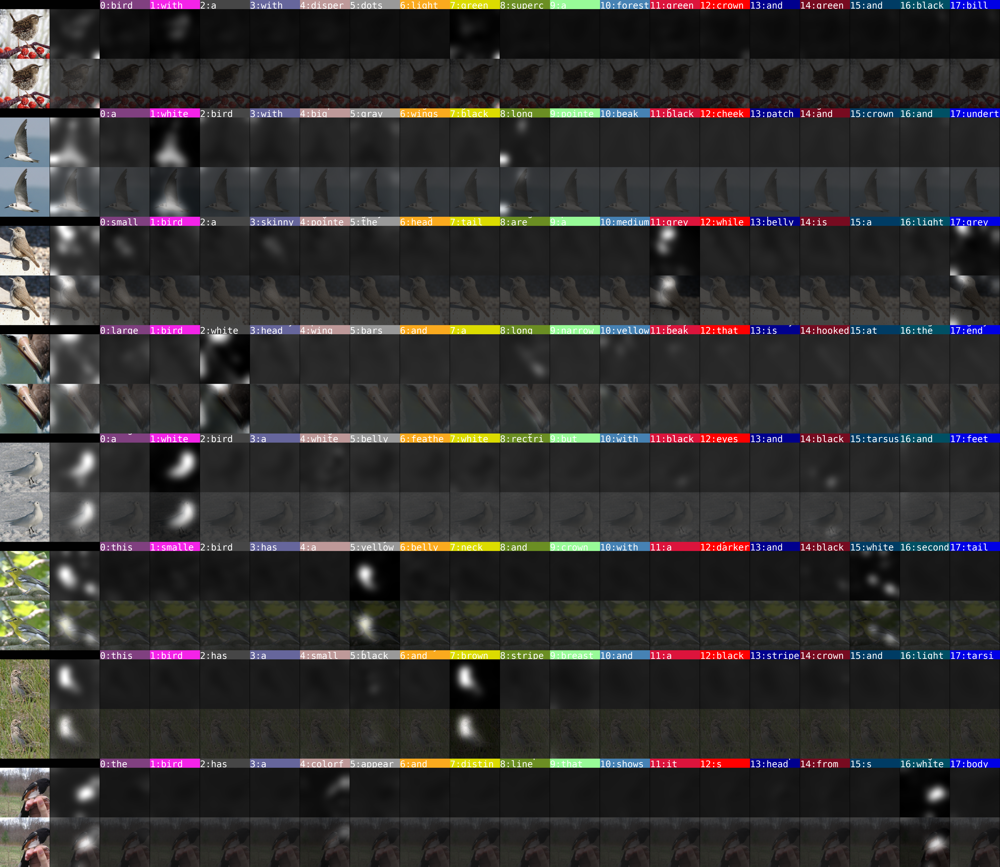

Step 1
Step 2
Step 3
Step 4
Step 5
Step 6
Step 7
Step 8
Step 9
Step 10
Step 11
Step 12
Step 13
Step 14
Step 15
Step 16
Step 17
Step 18
Step 19
Step 20
Step 21
Step 22
Step 23
Step 24
Step 25
Step 26
Step 27
Step 28
Step 29
Step 30
Step 31
Step 32
Step 33
Step 34
Step 35
Step 36
Step 37
Step 38
Step 39
Step 40
Step 41
Step 42
Step 43
Step 44
Step 45
Step 46
Step 47
Step 48
Step 49
Step 50
Step 51
Step 52
Step 53
Step 54
Step 55
Step 56
Step 57
Step 58
Step 59
Step 60
Step 61
Step 62
Step 63
Step 64
Step 65
Step 66
Step 67
Step 68
Step 69
Step 70
Step 71
Step 72
Step 73
Step 74
Step 75
Step 76
Step 77
Step 78
Step 79
Step 80
Step 81
Step 82
Step 83
Step 84
Step 85
Step 86
Step 87
Step 88
Step 89
Step 90
Step 91
Step 92
Step 93
Step 94
Step 95
Step 96
Step 97
Step 98
Step 99
Step 100
Step 101
Step 102
Step 103
Step 104
Step 105
Step 106
Step 107
Step 108
Step 109
Step 110
Step 111
Step 112
Step 113
Step 114
Step 115
Step 116
Step 117
Step 118
Step 119
Step 120
Step 121
Step 122
Step 123
S

In [86]:
import torch.optim as optim

lr = cfg.TRAIN.ENCODER_LR
for epoch in range(start_epoch, cfg.TRAIN.MAX_EPOCH):
    # TODO: how the optimizer works?
    optimizer = optim.Adam(para, lr=lr, betas=(0.5, 0.999))

    epoch_start_time = time.time()
    
    # We train here
    count = train(dataloader, image_encoder, text_encoder,
                  batch_size, labels, optimizer, epoch,
                  dataset.ixtoword, image_dir)
    
    # We evaluate here
    if len(dataloader_val) > 0:
        s_loss, w_loss = evaluate(dataloader_val, image_encoder,
                                  text_encoder, batch_size)
        print('| end epoch {:3d} | valid loss '
              '{:5.2f} {:5.2f} | lr {:.5f}|'
              .format(epoch, s_loss, w_loss, lr))

    if lr > cfg.TRAIN.ENCODER_LR/10.:
        lr *= 0.98

    # Did we reach the interval?
    # Or did we reach the max epochs?
    # Then save the Generator/Discriminator models
    if (epoch % cfg.TRAIN.SNAPSHOT_INTERVAL == 0 or
        epoch == cfg.TRAIN.MAX_EPOCH):
        torch.save(image_encoder.state_dict(),
                   '%s/image_encoder%d.pth' % (model_dir, epoch))
        torch.save(text_encoder.state_dict(),
                   '%s/text_encoder%d.pth' % (model_dir, epoch))
        print('Save G/Ds models.')

['The', 'quick', 'fox', 'jumped', 'over', 'the', 'lazy', 'Dog', 'Dog']
